<a href="https://colab.research.google.com/github/CaseyEva/SoftwareTechOne_Assignment_2/blob/main/ST1_Week_8_Tut_Lab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab
import drive drive.mount('/content/drive')

In [ ]:
#!unzip archive.zip

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**1. Mobile-Net Model**

In [ ]:
#Step 1
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import os
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image

# === USER VARIABLES ===

# Path to your dataset folder organized by class subfolders
#DATASET_DIR = 'dataset/'  # Change to your dataset path
DATASET_DIR = '/content/drive/MyDrive/insects_dataset/train_data/'
# Image input size and batch size for training
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 123  # For deterministic shuffling/splitting

# === STEP 1: Load dataset and split into train/validation ===

print("Loading dataset with 80/20 train-validation split...")
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset="training",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset="validation",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

class_names = train_ds.class_names
num_classes = len(class_names)
print(f"Classes found: {class_names}")




Loading dataset with 80/20 train-validation split...
Found 56 files belonging to 3 classes.
Using 45 files for training.
Found 56 files belonging to 3 classes.
Using 11 files for validation.
Classes found: ['Leuctra sp', 'Lymnea sp', 'Sialis sp']


In [ ]:
# === STEP 2: Optimize dataset performance ===

AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)

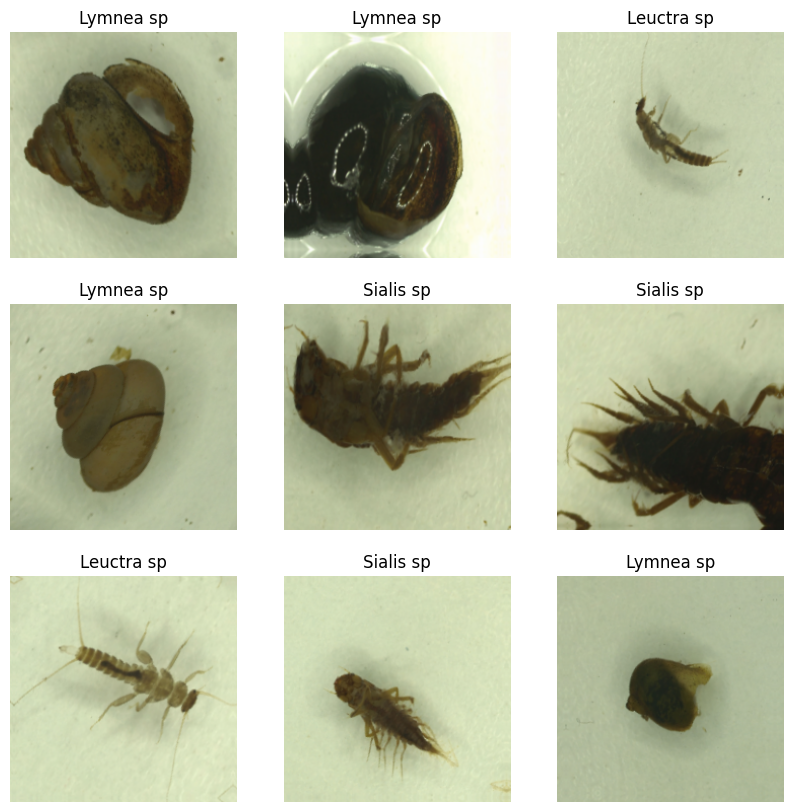

In [ ]:
# === STEP 3: Data augmentation (recommended) ===

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
])

# Visualize some augmented images
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    augmented_images = data_augmentation(images)
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")
plt.show()

In [ ]:
# === STEP 4: Build transfer learning model ===

base_model = tf.keras.applications.MobileNetV2(
    input_shape=IMG_SIZE + (3,),
    include_top=False,
    weights='imagenet'
)

base_model.trainable = False  # Freeze the base model initially

inputs = layers.Input(shape=IMG_SIZE + (3,))
x = data_augmentation(inputs)
x = tf.keras.applications.mobilenet_v2.preprocess_input(x)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(num_classes, activation='softmax')(x)

model = models.Model(inputs, outputs)

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 3)              │         3,843 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,261,827 (8.63 MB)

 Trainable params: 3,843 (15.01 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:

# === STEP 5: Train the model ===

EPOCHS = 10

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS
)

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 13s 5s/step - accuracy: 0.4444 - loss: 1.0703 - val_accuracy: 0.8182 - val_loss: 0.4988
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - accuracy: 0.6222 - loss: 0.9747 - val_accuracy: 0.8182 - val_loss: 0.3898
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 237ms/step - accuracy: 0.5778 - loss: 0.7814 - val_accuracy: 0.8182 - val_loss: 0.3175
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step - accuracy: 0.7556 - loss: 0.5072 - val_accuracy: 0.9091 - val_loss: 0.2654
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 241ms/step - accuracy: 0.8000 - loss: 0.5056 - val_accuracy: 0.9091 - val_loss: 0.2303
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 227ms/step - accuracy: 0.8667 - loss: 0.3652 - val_accuracy: 0.9091 - val_loss: 0.2052
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.8889 - loss: 0.3061 - val_accuracy: 0.9091 - val_loss: 0.1846
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 207ms/step - accuracy: 0.8667 - loss: 0.3159 - val_accuracy: 0.9091 - val_loss: 0

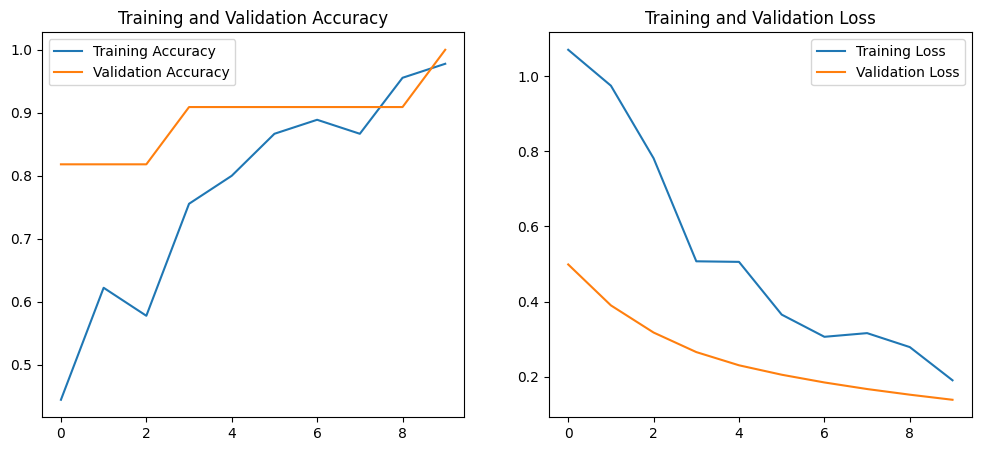

In [ ]:
# === STEP 6: Plot training curves ===

# Re-extracting from history to ensure correct length for initial EPOCHS
initial_acc = history.history['accuracy']
initial_val_acc = history.history['val_accuracy']
initial_loss = history.history['loss']
initial_val_loss = history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, initial_acc, label='Training Accuracy')
plt.plot(epochs_range, initial_val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, initial_loss, label='Training Loss')
plt.plot(epochs_range, initial_val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
# === STEP 7: Evaluate on validation set ===

val_loss, val_acc = model.evaluate(val_ds)
print(f'Validation accuracy: {val_acc*100:.2f}%')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 1.0000 - loss: 0.1385
Validation accuracy: 100.00%


In [ ]:
# === STEP 9: Save the trained model ===
%cd /content/drive/MyDrive/Random ST1 things
model.save('macroinvertebrates_classifier.h5')
print("Model saved as 'macroinvertebrates_classifier.h5'")

/content/drive/MyDrive/Random ST1 things
Model saved as 'macroinvertebrates_classifier.h5'


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


<Figure size 1200x1200 with 0 Axes>

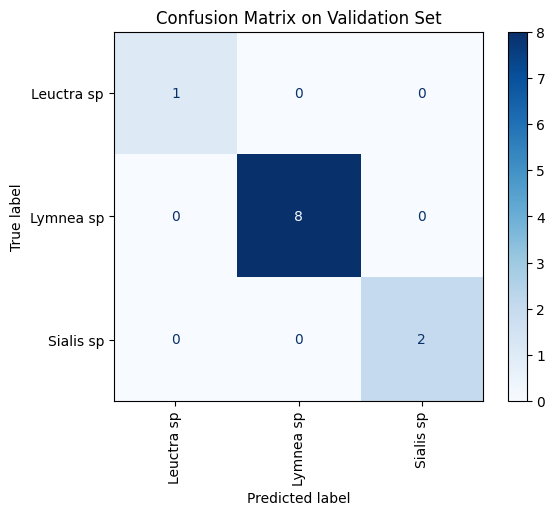

Weighted Precision: 1.0000
Weighted Recall:    1.0000
Weighted F1-score:  1.0000


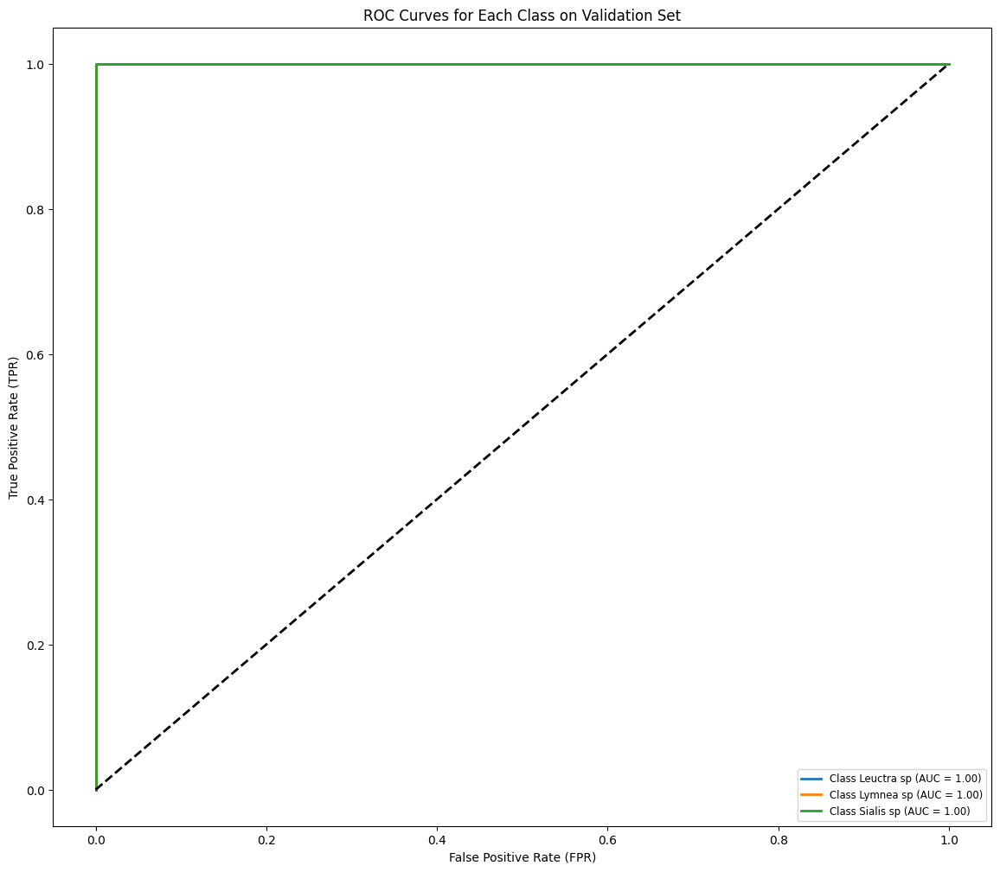

In [ ]:
# === STEP 10: Evaluate model with confusion matrix, precision, recall, F1-score ===

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    precision_recall_fscore_support,
    roc_curve, auc
)
from sklearn.preprocessing import label_binarize
import tensorflow as tf
import os

# Step 10.1: Aggregate predictions and true labels from validation dataset
y_true = []
y_pred = []
y_scores = []

for images, labels in val_ds:
    preds = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))
    y_scores.extend(preds)

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_scores = np.array(y_scores)

# Step 10.2: Confusion Matrix Plot
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

plt.figure(figsize=(12,12))
disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical')
plt.title('Confusion Matrix on Validation Set')
plt.show()

# Step 10.3: Precision, Recall, F1-score (weighted average)
precision, recall, f1, _ = precision_recall_fscore_support(
    y_true, y_pred, average='weighted'
)
print(f"Weighted Precision: {precision:.4f}")
print(f"Weighted Recall:    {recall:.4f}")
print(f"Weighted F1-score:  {f1:.4f}")

# Step 10.4: Multi-class ROC curves and AUC

# Binarize the labels for multi-class ROC
y_true_bin = label_binarize(y_true, classes=range(len(class_names)))
n_classes = y_true_bin.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()

plt.figure(figsize=(14, 12))

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], lw=2,
             label=f'Class {class_names[i]} (AUC = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.title("ROC Curves for Each Class on Validation Set")
plt.legend(loc="lower right", fontsize='small')
plt.show()



Running inference on images from 'test_images' folder...
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Image: CPH-Leuctra sp.-1905-t.png --> Predicted: Lymnea sp (95.32%)


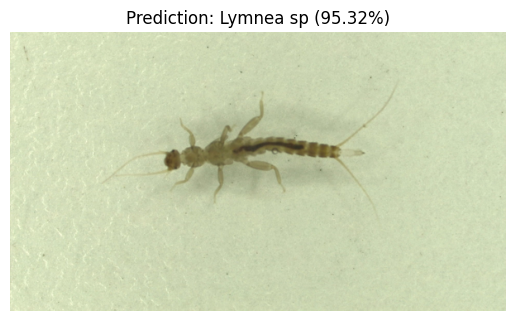

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Original Image: CPH-Leuctra sp.-1908-t.png --> Predicted: Lymnea sp (95.09%)


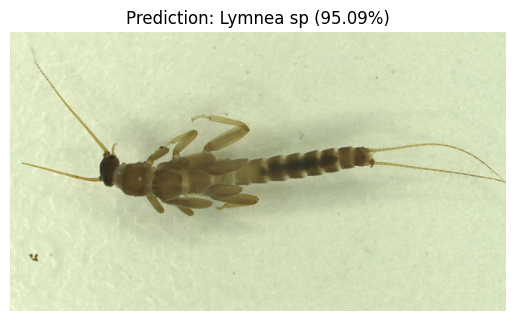

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Original Image: CPH-Leuctra sp.-1922-t.png --> Predicted: Lymnea sp (95.04%)


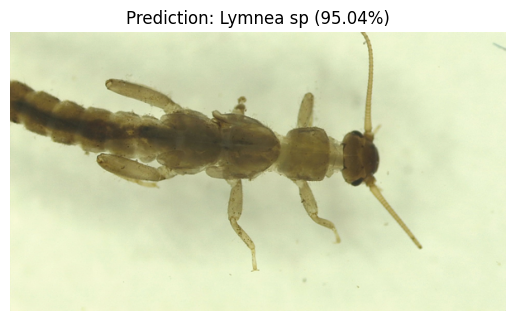

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Original Image: CPH-Leuctra sp.-2160-v.png --> Predicted: Lymnea sp (95.33%)


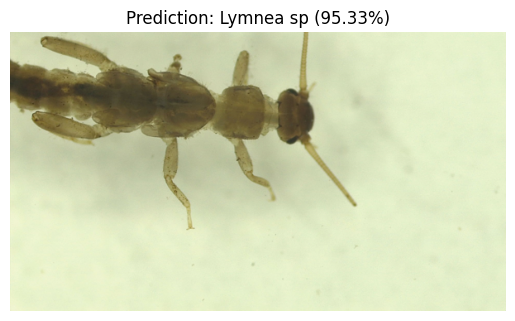

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
Original Image: CPH-Leuctra sp.-1910-t.png --> Predicted: Lymnea sp (95.04%)


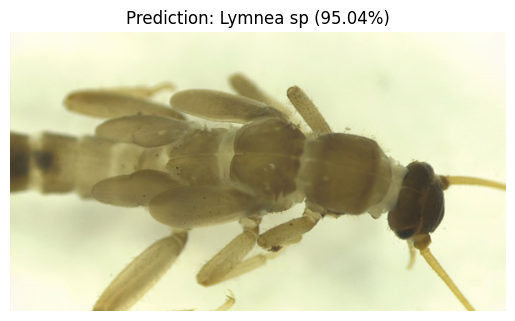

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Original Image: CPH-Lymnea sp.-1956-t.png --> Predicted: Lymnea sp (95.19%)


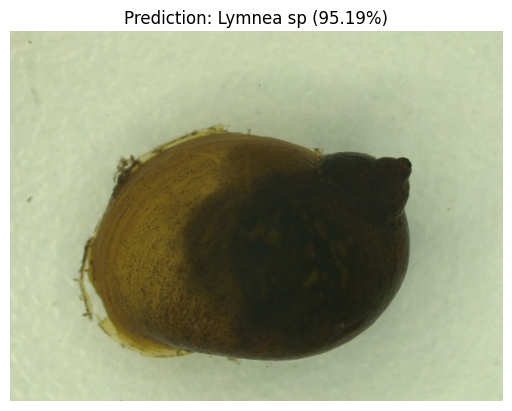

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Original Image: CPH-Lymnea sp.-1964-t.png --> Predicted: Lymnea sp (95.01%)


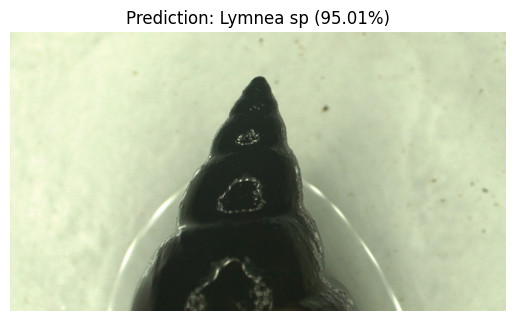

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
Original Image: CPH-Lymnea sp.-1973-t.png --> Predicted: Lymnea sp (95.15%)


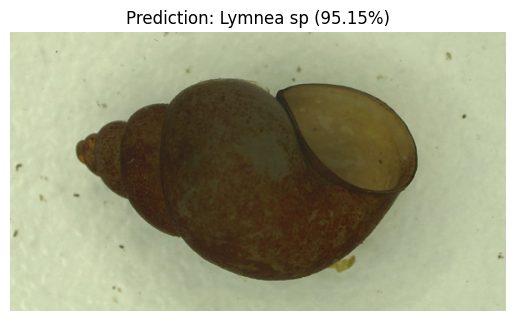

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Original Image: CPH-Lymnea sp.-1967-t.png --> Predicted: Lymnea sp (95.22%)


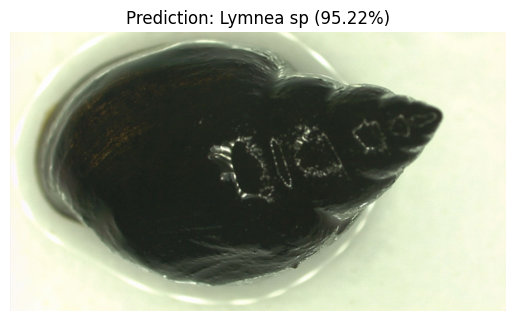

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Original Image: CPH-Lymnea sp.-1958-t.png --> Predicted: Lymnea sp (95.27%)


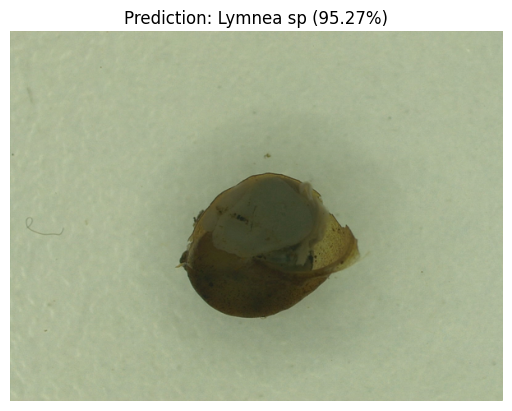

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
Original Image: CPH-Sialis sp.-2413-t.png --> Predicted: Lymnea sp (95.09%)


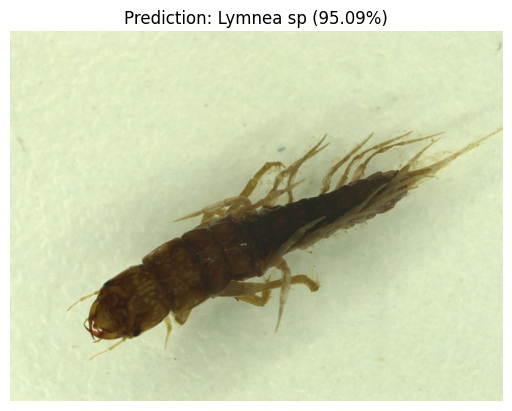

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Original Image: CPH-Sialis sp.-2409-t.png --> Predicted: Lymnea sp (95.20%)


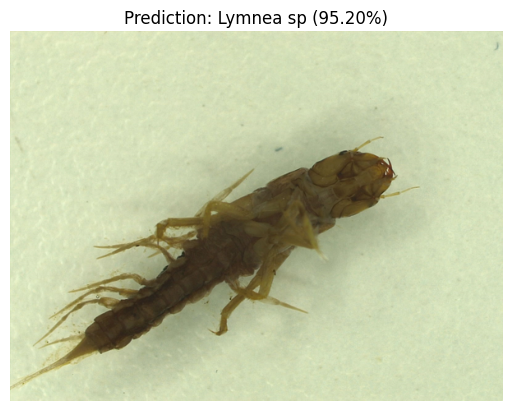

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Original Image: CPH-Sialis sp.-2410-t.png --> Predicted: Lymnea sp (94.98%)


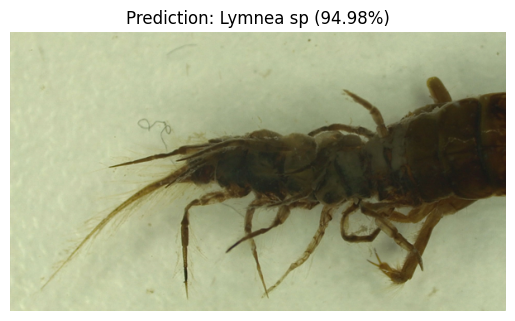

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Original Image: CPH-Sialis sp.-2408-t.png --> Predicted: Lymnea sp (95.32%)


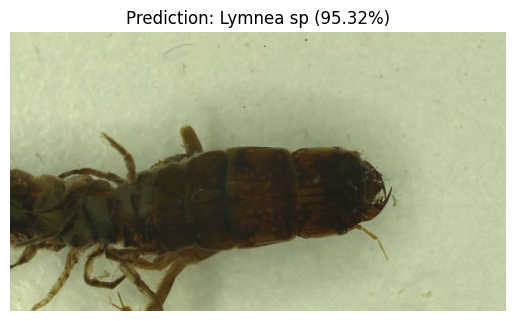

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Original Image: CPH-Sialis sp.-2411-t.png --> Predicted: Lymnea sp (94.91%)


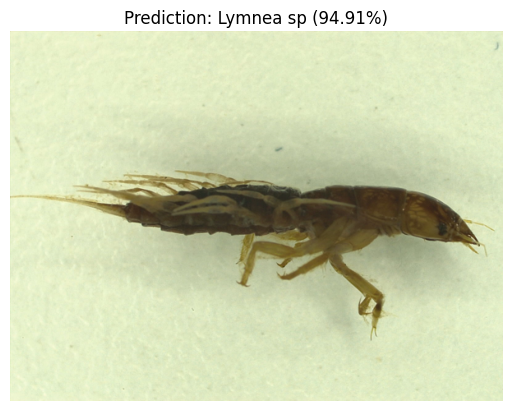

In [ ]:
# === STEP 12: Inference on new images in 'test_images' folder ===

#TEST_IMAGE_DIR = 'test_images'
TEST_IMAGE_DIR = '/content/drive/MyDrive/insects_dataset/test_data'
os.makedirs(TEST_IMAGE_DIR, exist_ok=True)

def load_and_preprocess_image(img_path, img_size=IMG_SIZE):
    img = image.load_img(img_path, target_size=img_size)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # batch size 1
    return img_array

def predict_new_images(test_dir):
    img_files = [f for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if not img_files:
        print(f"No images found in '{test_dir}'. Please add some images and rerun.")
        return

    for img_file in img_files:
        path = os.path.join(test_dir, img_file)
        img_arr = load_and_preprocess_image(path)
        preds = model.predict(img_arr)
        pred_idx = np.argmax(preds[0])
        confidence = preds[0][pred_idx]

        print(f"Original Image: {img_file} --> Predicted: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        img = image.load_img(path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Prediction: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        plt.show()

print("Running inference on images from 'test_images' folder...")
predict_new_images(TEST_IMAGE_DIR)


**2. EfficientNet Model**

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import numpy as np
import os


In [ ]:
DATASET_DIR = '/content/drive/MyDrive/insects_dataset/train_data/'

In [ ]:
IMG_SIZE = (224, 224)        # EfficientNetB0 default input size
BATCH_SIZE = 32
SEED = 123

In [ ]:
# === STEP 1: Load dataset with 80/20 train-validation split ===

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset="training",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset="validation",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

class_names = train_ds.class_names
num_classes = len(class_names)
print("Classes:", class_names)

Found 56 files belonging to 3 classes.
Using 45 files for training.
Found 56 files belonging to 3 classes.
Using 11 files for validation.
Classes: ['Leuctra sp', 'Lymnea sp', 'Sialis sp']


In [ ]:
# === STEP 2: Optimize dataset performance ===

AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)

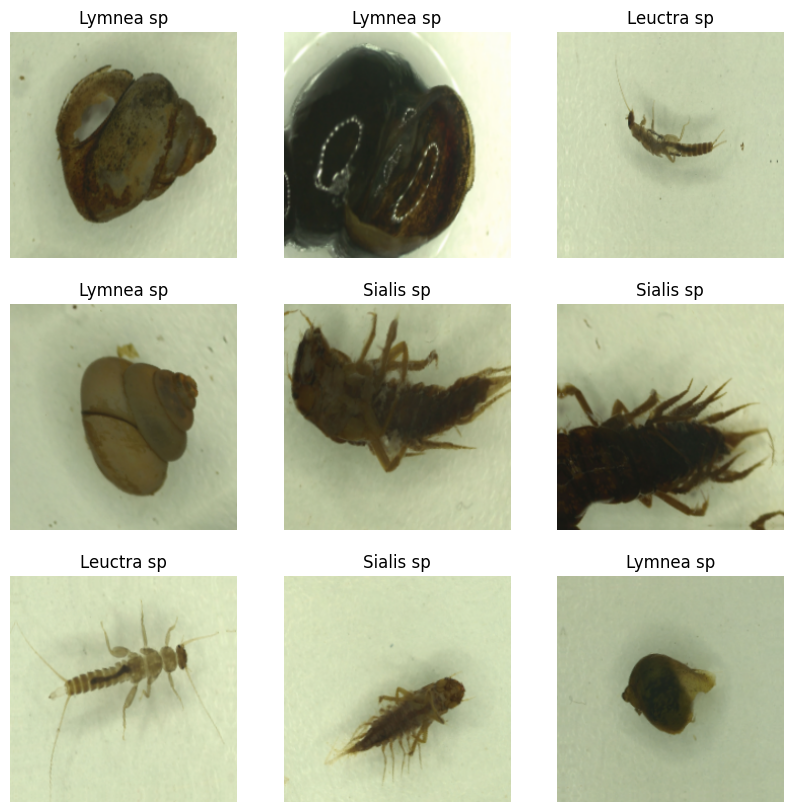

In [ ]:
# === STEP 3: Data augmentation ===

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
])

# Optional: visualize augmented images
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    augmented = data_augmentation(images)
    for i in range(9):
        ax = plt.subplot(3, 3, i+1)
        plt.imshow(augmented[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")
plt.show()


In [ ]:
# === STEP 4: Build transfer learning model with EfficientNetB0 ===

base_model = tf.keras.applications.EfficientNetB0(
    input_shape=IMG_SIZE + (3,),
    include_top=False,
    weights='imagenet'
)
base_model.trainable = False  # freeze base

inputs = layers.Input(shape=IMG_SIZE + (3,))
x = data_augmentation(inputs)               # apply augmentation
x = tf.keras.applications.efficientnet.preprocess_input(x)  # preprocess as EfficientNet expects
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(num_classes, activation='softmax')(x)
model = models.Model(inputs, outputs)

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_1 (Sequential)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │         3,843 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,053,414 (15.46 MB)

 Trainable params: 3,843 (15.01 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [ ]:
# === STEP 5: Train the model ===

EPOCHS = 10

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS
)

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 14s 3s/step - accuracy: 0.4000 - loss: 1.0959 - val_accuracy: 0.5455 - val_loss: 0.9084
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 215ms/step - accuracy: 0.6222 - loss: 0.8440 - val_accuracy: 0.5455 - val_loss: 0.7064
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 238ms/step - accuracy: 0.6444 - loss: 0.7439 - val_accuracy: 0.8182 - val_loss: 0.5576
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 240ms/step - accuracy: 0.7556 - loss: 0.6364 - val_accuracy: 1.0000 - val_loss: 0.4484
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step - accuracy: 0.8222 - loss: 0.4829 - val_accuracy: 1.0000 - val_loss: 0.3692
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 309ms/step - accuracy: 0.9111 - loss: 0.4260 - val_accuracy: 1.0000 - val_loss: 0.3099
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 315ms/step - accuracy: 0.9556 - loss: 0.3732 - val_accuracy: 1.0000 - val_loss: 0.2629
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 467ms/step - accuracy: 0.9778 - loss: 0.3230 - val_accuracy: 1.0000 - val_loss: 0

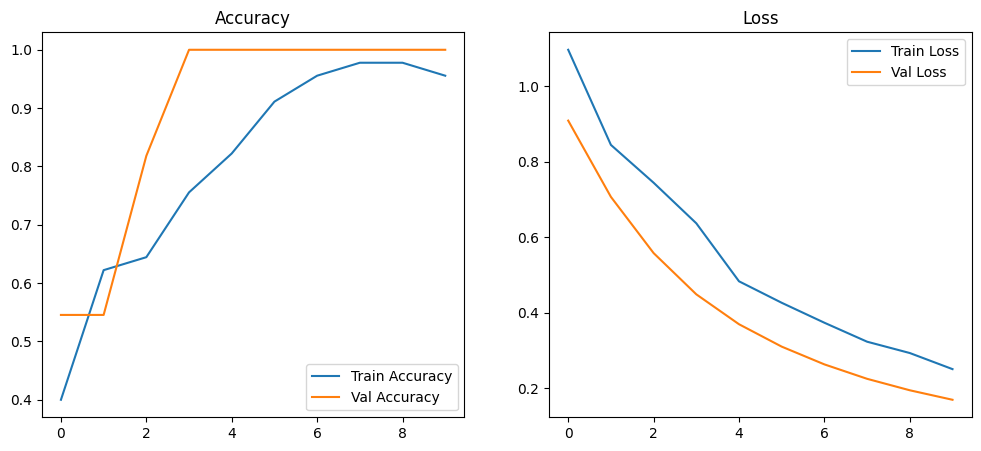

In [ ]:
# === STEP 6: Plot training curves ===

acc, val_acc = history.history['accuracy'], history.history['val_accuracy']
loss, val_loss = history.history['loss'], history.history['val_loss']

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Train Accuracy')
plt.plot(val_acc, label='Val Accuracy')
plt.legend()
plt.title('Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Train Loss')
plt.plot(val_loss, label='Val Loss')
plt.legend()
plt.title('Loss')

plt.show()

Epoch 10/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 31s 4s/step - accuracy: 0.8667 - loss: 0.6115 - val_accuracy: 1.0000 - val_loss: 0.1698
Epoch 11/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 240ms/step - accuracy: 0.8222 - loss: 0.6133 - val_accuracy: 1.0000 - val_loss: 0.1706
Epoch 12/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 249ms/step - accuracy: 0.7556 - loss: 0.6756 - val_accuracy: 1.0000 - val_loss: 0.1707
Epoch 13/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 240ms/step - accuracy: 0.8444 - loss: 0.6115 - val_accuracy: 1.0000 - val_loss: 0.1708
Epoch 14/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 238ms/step - accuracy: 0.8000 - loss: 0.6296 - val_accuracy: 1.0000 - val_loss: 0.1706
Epoch 15/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 201ms/step - accuracy: 0.8222 - loss: 0.6132 - val_accuracy: 1.0000 - val_loss: 0.1709
Epoch 16/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - accuracy: 0.8000 - loss: 0.6171 - val_accuracy: 1.0000 - val_loss: 0.1714
Epoch 17/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 216ms/step - accuracy: 0.8667 - loss: 0.5980 - val_accuracy: 1.0000 - val

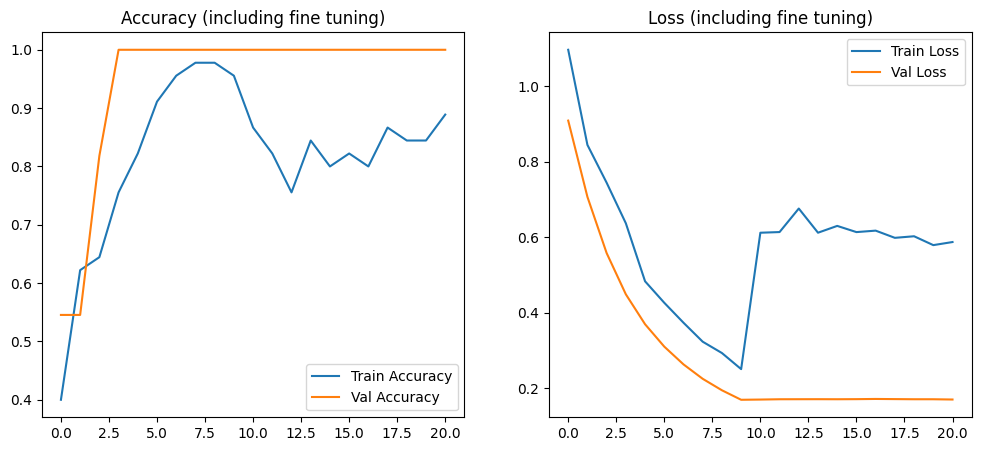

In [ ]:
# === STEP 7 (Optional): Fine-tune base model ===

base_model.trainable = True

# Freeze initial layers, train last layers of EfficientNet
fine_tune_at = 100  # Freeze all layers before this
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

fine_tune_epochs = 10
total_epochs = EPOCHS + fine_tune_epochs

history_fine = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=total_epochs,
    initial_epoch=history.epoch[-1]
)

# Plot fine-tuning results (optional)
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']
loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Train Accuracy')
plt.plot(val_acc, label='Val Accuracy')
plt.legend()
plt.title('Accuracy (including fine tuning)')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Train Loss')
plt.plot(val_loss, label='Val Loss')
plt.legend()
plt.title('Loss (including fine tuning)')

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


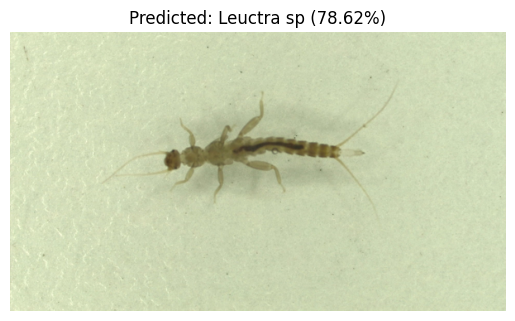

In [ ]:
# === STEP 8: Prediction on new images ===

from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def load_and_preprocess_image(img_path):
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = tf.keras.applications.efficientnet.preprocess_input(img_array)
    return img_array

def predict_image(img_path, model, class_names):
    img_array = load_and_preprocess_image(img_path)
    preds = model.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx]
    return class_names[pred_idx], confidence

# Example usage:
test_img_path = '/content/drive/MyDrive/insects_dataset/test_data/CPH-Leuctra sp.-1905-t.png'  # replace with your test image path
predicted_class, confidence = predict_image(test_img_path, model, class_names)

plt.imshow(image.load_img(test_img_path))
plt.title(f'Predicted: {predicted_class} ({confidence * 100:.2f}%)')
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


<Figure size 1200x1200 with 0 Axes>

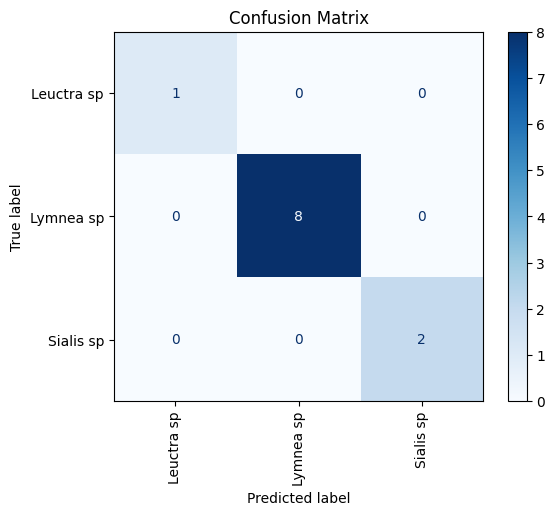

Precision: 1.0000
Recall:    1.0000
F1-score:  1.0000


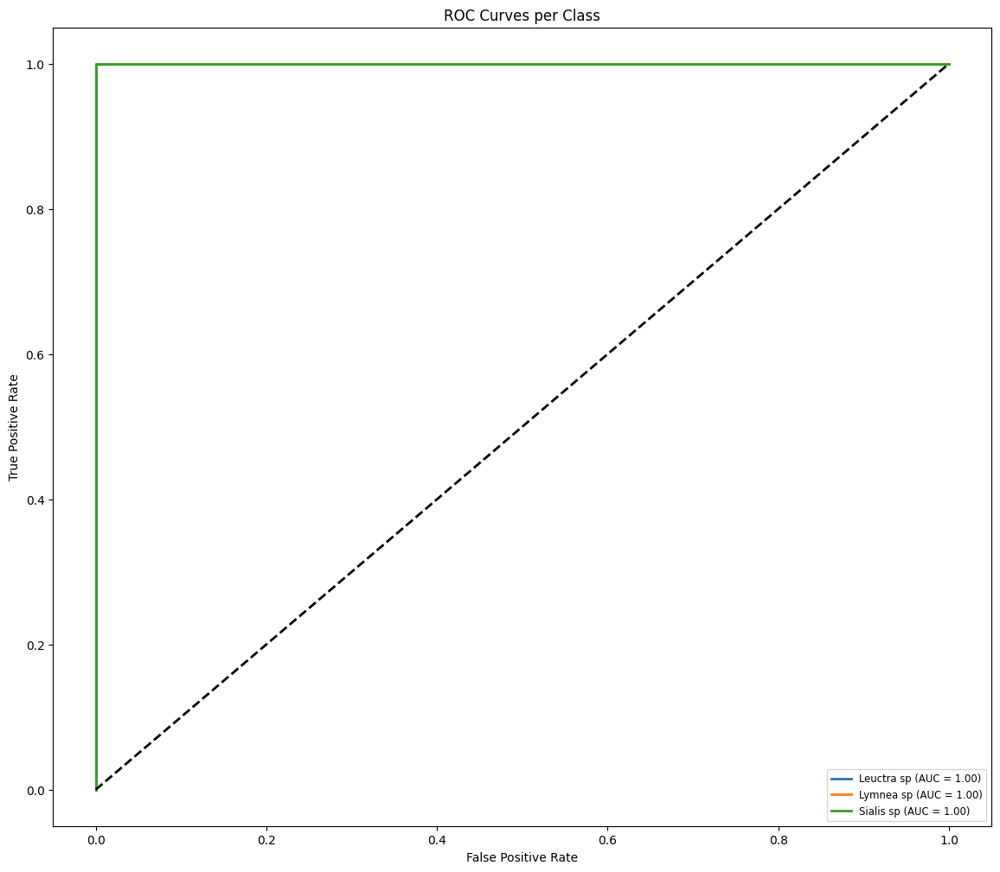

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    precision_recall_fscore_support,
    roc_curve, auc
)
from sklearn.preprocessing import label_binarize
import tensorflow as tf

# Aggregate true labels and predictions from validation dataset
y_true = []
y_pred = []
y_score = []

for images, labels in val_ds:
    preds = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))
    y_score.extend(preds)

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_score = np.array(y_score)

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
plt.figure(figsize=(12, 12))
disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical')
plt.title('Confusion Matrix')
plt.show()

# Precision, Recall and F1-score
precision, recall, f1, _ = precision_recall_fscore_support(
    y_true, y_pred, average='weighted'  # options: 'micro', 'macro', None...
)
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1-score:  {f1:.4f}")

# ROC Curve and AUC for multi-class
n_classes = len(class_names)
y_true_bin = label_binarize(y_true, classes=range(n_classes))

fpr = dict()
tpr = dict()
roc_auc = dict()

plt.figure(figsize=(14, 12))
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], lw=2, label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves per Class')
plt.legend(loc='lower right', fontsize='small')
plt.show()


Running inference on images from 'test_images' folder...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
Original Image: CPH-Leuctra sp.-1905-t.png --> Predicted: Leuctra sp (45.38%)


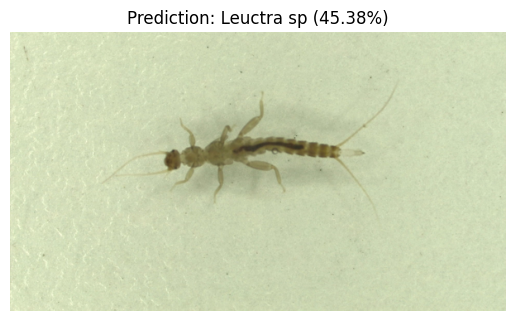

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
Original Image: CPH-Leuctra sp.-1908-t.png --> Predicted: Leuctra sp (45.38%)


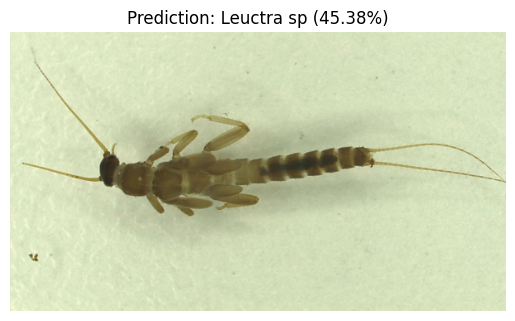

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
Original Image: CPH-Leuctra sp.-1922-t.png --> Predicted: Leuctra sp (45.40%)


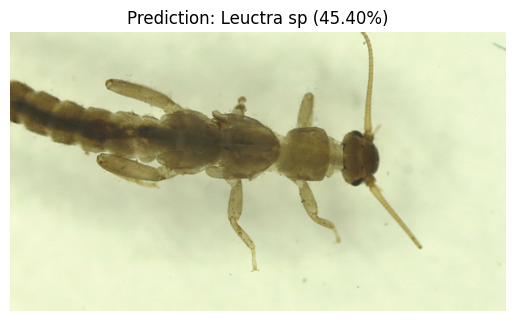

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
Original Image: CPH-Leuctra sp.-2160-v.png --> Predicted: Leuctra sp (45.40%)


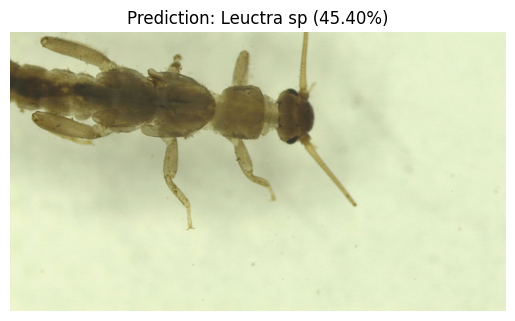

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Original Image: CPH-Leuctra sp.-1910-t.png --> Predicted: Leuctra sp (45.39%)


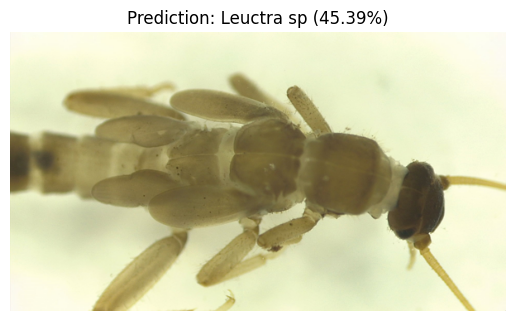

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Original Image: CPH-Lymnea sp.-1956-t.png --> Predicted: Leuctra sp (45.32%)


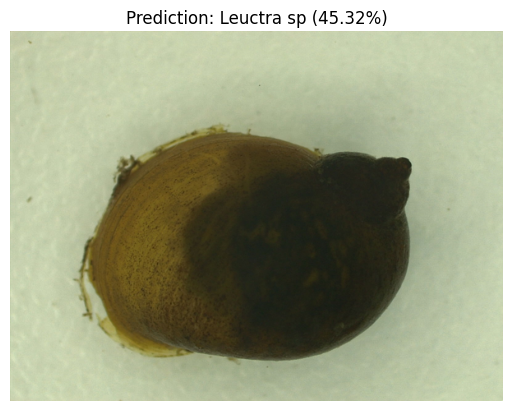

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Original Image: CPH-Lymnea sp.-1964-t.png --> Predicted: Leuctra sp (45.34%)


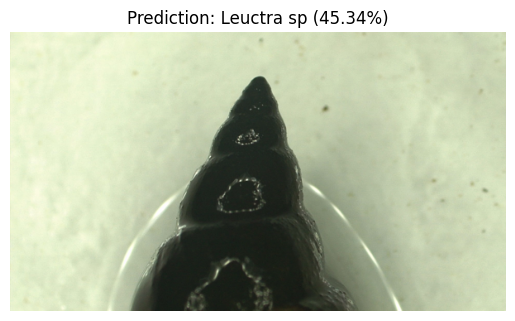

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Original Image: CPH-Lymnea sp.-1973-t.png --> Predicted: Leuctra sp (45.33%)


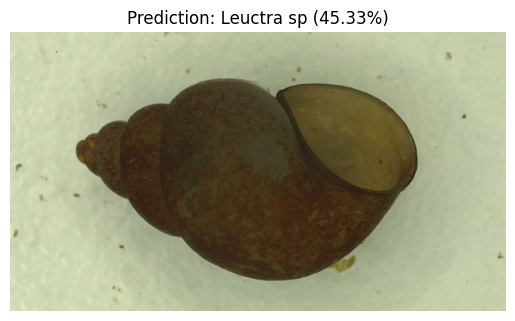

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Original Image: CPH-Lymnea sp.-1967-t.png --> Predicted: Leuctra sp (45.30%)


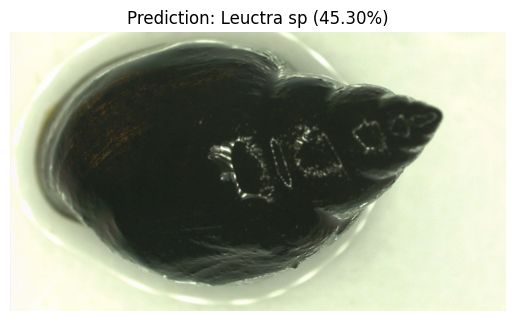

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Original Image: CPH-Lymnea sp.-1958-t.png --> Predicted: Leuctra sp (45.35%)


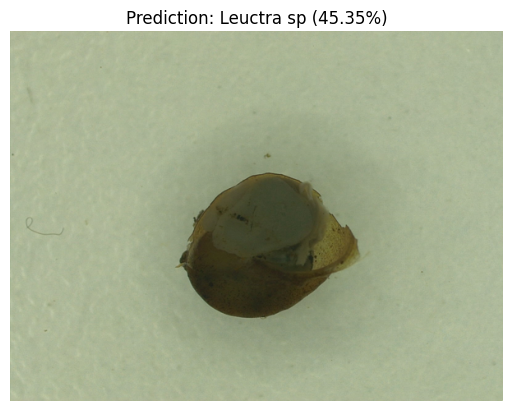

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Original Image: CPH-Sialis sp.-2413-t.png --> Predicted: Leuctra sp (45.39%)


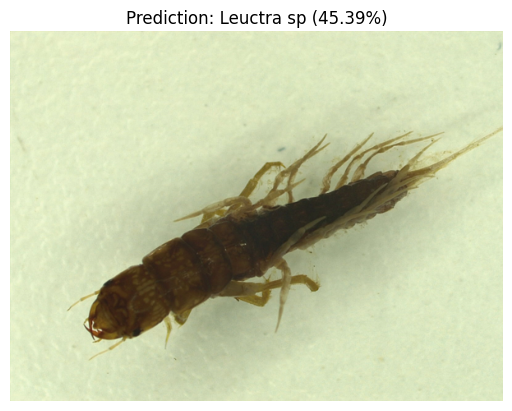

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Original Image: CPH-Sialis sp.-2409-t.png --> Predicted: Leuctra sp (45.38%)


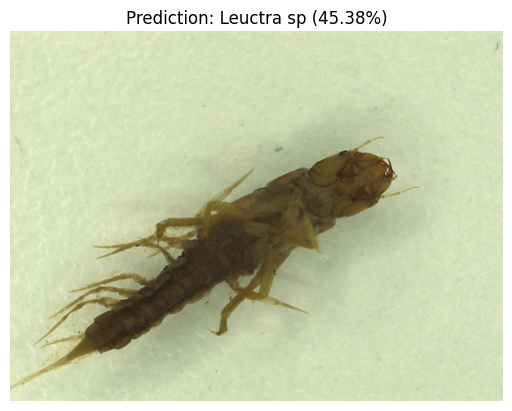

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
Original Image: CPH-Sialis sp.-2410-t.png --> Predicted: Leuctra sp (45.36%)


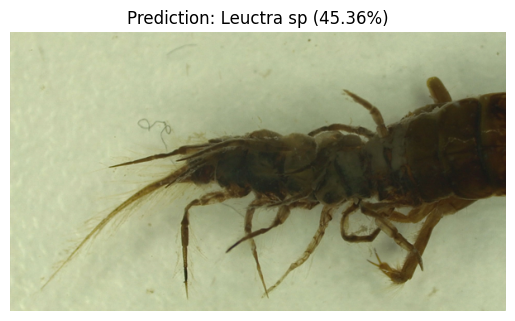

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Original Image: CPH-Sialis sp.-2408-t.png --> Predicted: Leuctra sp (45.35%)


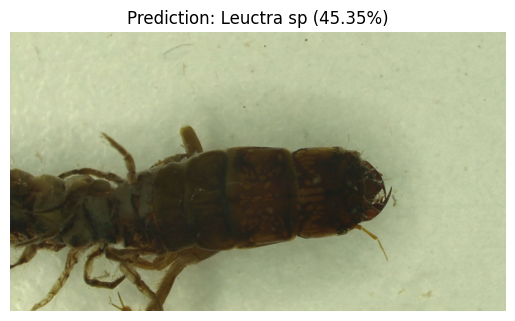

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Original Image: CPH-Sialis sp.-2411-t.png --> Predicted: Leuctra sp (45.38%)


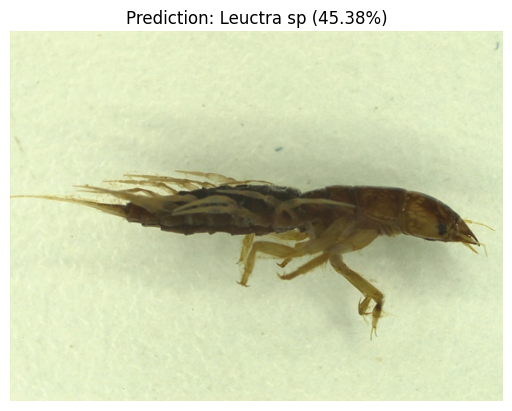

In [ ]:
# === STEP 12: Inference on new images in 'test_images' folder ===

#TEST_IMAGE_DIR = 'test_images'
TEST_IMAGE_DIR = '/content/drive/MyDrive/insects_dataset/test_data'
os.makedirs(TEST_IMAGE_DIR, exist_ok=True)

def load_and_preprocess_image(img_path, img_size=IMG_SIZE):
    img = image.load_img(img_path, target_size=img_size)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # batch size 1
    return img_array

def predict_new_images(test_dir):
    img_files = [f for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if not img_files:
        print(f"No images found in '{test_dir}'. Please add some images and rerun.")
        return

    for img_file in img_files:
        path = os.path.join(test_dir, img_file)
        img_arr = load_and_preprocess_image(path)
        preds = model.predict(img_arr)
        pred_idx = np.argmax(preds[0])
        confidence = preds[0][pred_idx]

        print(f"Original Image: {img_file} --> Predicted: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        img = image.load_img(path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Prediction: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        plt.show()

print("Running inference on images from 'test_images' folder...")
predict_new_images(TEST_IMAGE_DIR)


**3. Vision Transformer Model**

In [ ]:
#!pip install tensorflow tensorflow-hub tensorflow-datasets matplotlib


In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
import os

In [ ]:
# === User parameters ===
DATASET_DIR = '/content/drive/MyDrive/insects_dataset/train_data/'  # Your insect dataset folder organized by classes
IMG_SIZE = 224            # ViT input size
BATCH_SIZE = 32
SEED = 123
EPOCHS = 10

In [ ]:

# === Step 1: Load Dataset with 80/20 split ===

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset='training',
    seed=SEED,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset='validation',
    seed=SEED,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)

class_names = train_ds.class_names
num_classes = len(class_names)
print(f"Classes: {class_names}")

AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)


Found 56 files belonging to 3 classes.
Using 45 files for training.
Found 56 files belonging to 3 classes.
Using 11 files for validation.
Classes: ['Leuctra sp', 'Lymnea sp', 'Sialis sp']


In [ ]:
# === Step 2: Data augmentation ===

data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomZoom(0.1),
])

In [ ]:
# === Step 3: Load ViT Feature Extractor from TF Hub ===

vit_url = "https://tfhub.dev/sayakpaul/vit_b16_fe/1"
vit_layer = hub.KerasLayer(vit_url, trainable=False)

In [ ]:
#====Step 4:
inputs = tf.keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

# Data augmentation
x = data_augmentation(inputs)

# The TF Hub ViT module expects pixel values in [0, 255].
# image_dataset_from_directory typically outputs float32 in [0, 255],
# and data_augmentation maintains this. So, no explicit [0,1] scaling is needed here.

# ViT feature extractor
# Wrap the vit_layer call in a Lambda layer to ensure proper symbolic tensor handling
features = tf.keras.layers.Lambda(lambda y: vit_layer(y))(x);

# Classification head
outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(features)

model = tf.keras.Model(inputs, outputs)

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:

# === Step 5: Train the model ===

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
)

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 18s 8s/step - accuracy: 0.2889 - loss: 2.6247 - val_accuracy: 0.6364 - val_loss: 0.9078
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 381ms/step - accuracy: 0.5111 - loss: 1.2393 - val_accuracy: 0.7273 - val_loss: 0.6320
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 379ms/step - accuracy: 0.4222 - loss: 1.3181 - val_accuracy: 0.3636 - val_loss: 0.9246
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 384ms/step - accuracy: 0.3111 - loss: 1.4284 - val_accuracy: 0.1818 - val_loss: 1.0712
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 406ms/step - accuracy: 0.2667 - loss: 1.3044 - val_accuracy: 0.4545 - val_loss: 0.8290
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 397ms/step - accuracy: 0.4222 - loss: 1.0174 - val_accuracy: 0.8182 - val_loss: 0.7227
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 444ms/step - accuracy: 0.5111 - loss: 0.9643 - val_accuracy: 0.5455 - val_loss: 0.8760
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 444ms/step - accuracy: 0.4889 - loss: 1.0260 - val_accuracy: 0.5455 - val_loss: 0

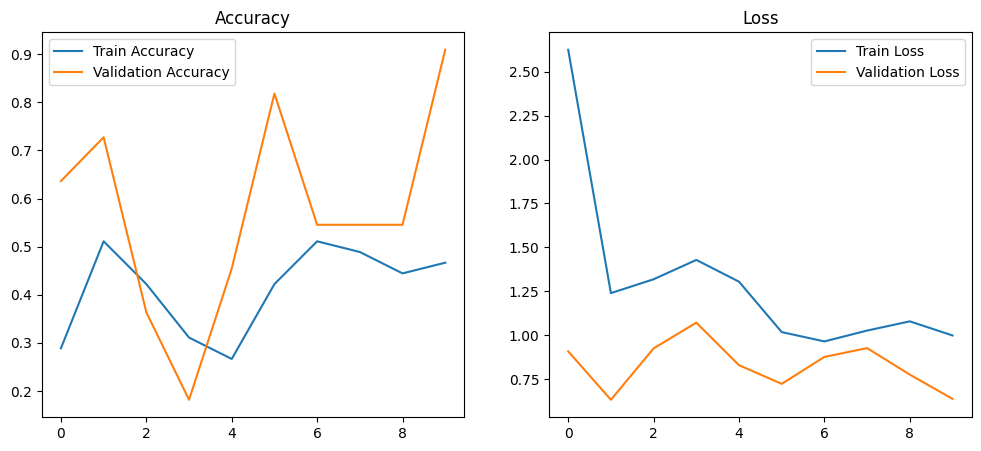

In [ ]:
# === Step 6: Plot training & validation accuracy/loss ===

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss')

plt.show()


In [ ]:
# === Step 7: Prediction helper function ===

def load_and_preprocess_image(img_path):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0
    return img_array

def predict_image(img_path, model, class_names):
    img_array = load_and_preprocess_image(img_path)
    preds = model.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx]
    return class_names[pred_idx], confidence


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


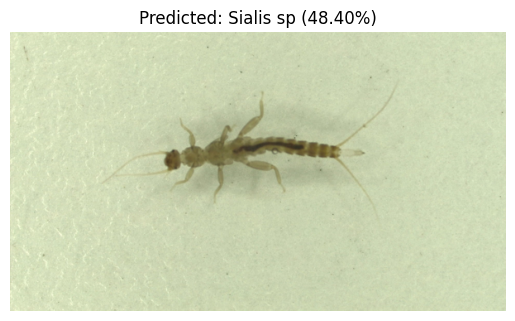

In [ ]:
# === Example prediction ===
test_img_path = '/content/drive/MyDrive/insects_dataset/test_data/CPH-Leuctra sp.-1905-t.png'  # Replace with your image path

predicted_class, confidence = predict_image(test_img_path, model, class_names)

plt.imshow(tf.keras.preprocessing.image.load_img(test_img_path))
plt.title(f'Predicted: {predicted_class} ({confidence*100:.2f}%)')
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


<Figure size 1200x1200 with 0 Axes>

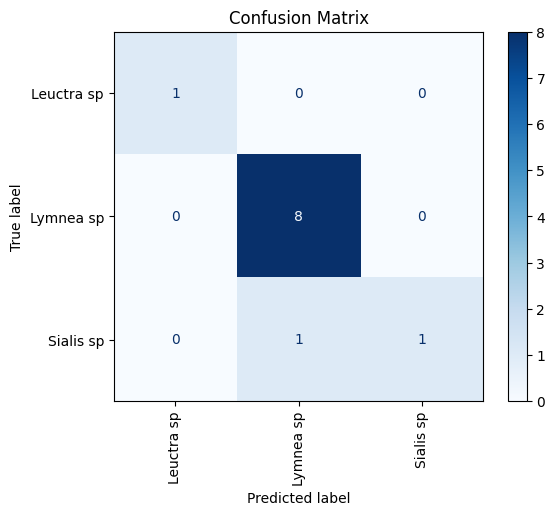

Precision: 0.9192
Recall:    0.9091
F1-score:  0.8966


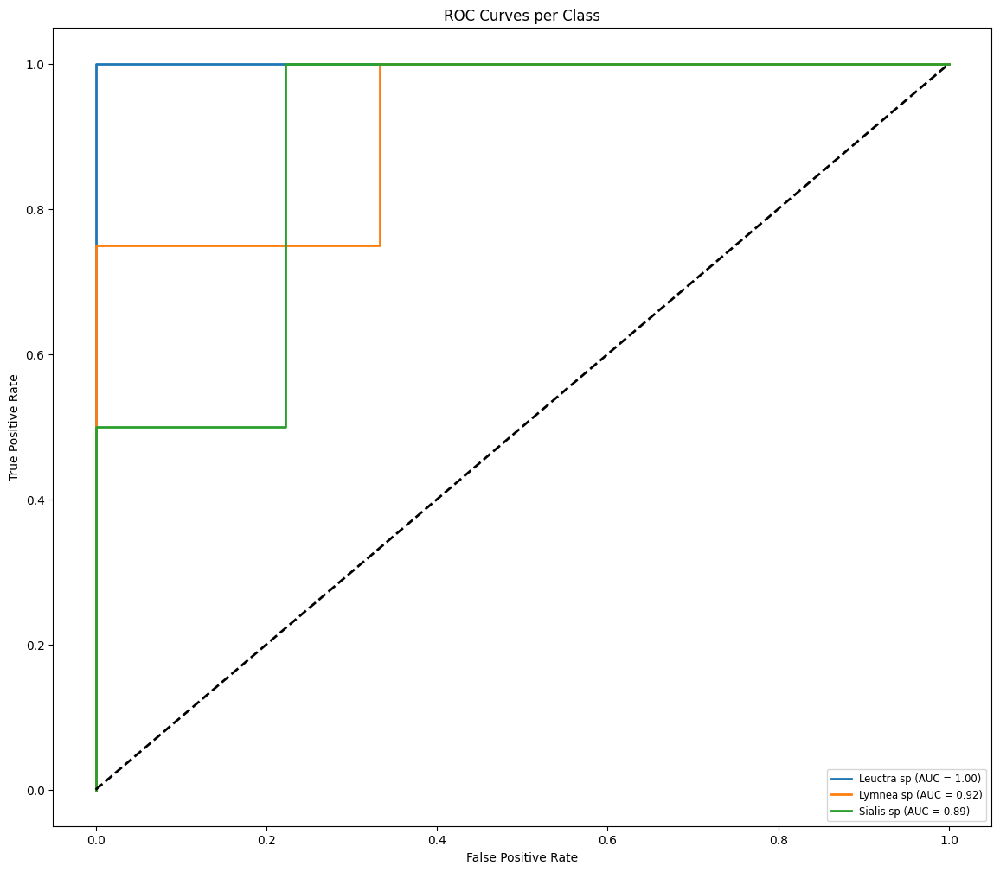

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    precision_recall_fscore_support,
    roc_curve, auc
)
from sklearn.preprocessing import label_binarize
import tensorflow as tf

# Aggregate true labels and predictions from validation dataset
y_true = []
y_pred = []
y_score = []

for images, labels in val_ds:
    preds = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))
    y_score.extend(preds)

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_score = np.array(y_score)

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
plt.figure(figsize=(12, 12))
disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical')
plt.title('Confusion Matrix')
plt.show()

# Precision, Recall and F1-score
precision, recall, f1, _ = precision_recall_fscore_support(
    y_true, y_pred, average='weighted'  # options: 'micro', 'macro', None...
)
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1-score:  {f1:.4f}")

# ROC Curve and AUC for multi-class
n_classes = len(class_names)
y_true_bin = label_binarize(y_true, classes=range(n_classes))

fpr = dict()
tpr = dict()
roc_auc = dict()

plt.figure(figsize=(14, 12))
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], lw=2, label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves per Class')
plt.legend(loc='lower right', fontsize='small')
plt.show()


Running inference on images from 'test_images' folder...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
Original Image: CPH-Leuctra sp.-1905-t.png --> Predicted: Sialis sp (48.40%)


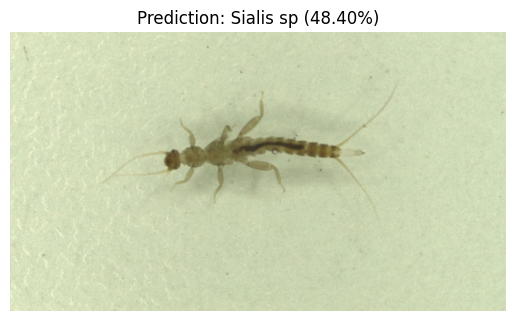

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
Original Image: CPH-Leuctra sp.-1908-t.png --> Predicted: Sialis sp (84.25%)


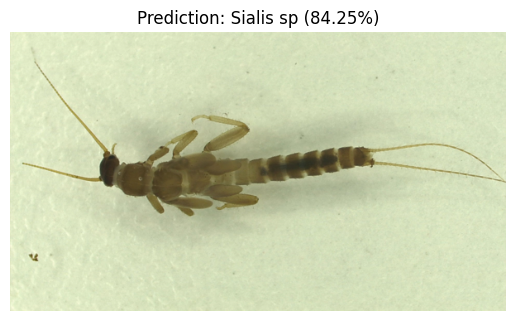

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Original Image: CPH-Leuctra sp.-1922-t.png --> Predicted: Sialis sp (53.46%)


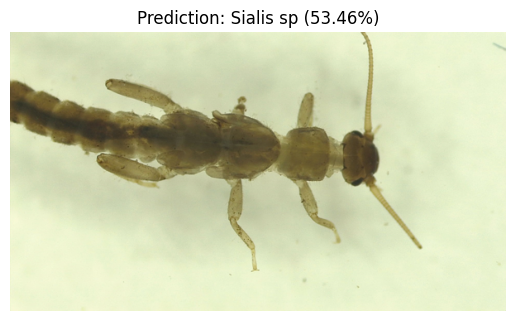

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Original Image: CPH-Leuctra sp.-2160-v.png --> Predicted: Sialis sp (86.63%)


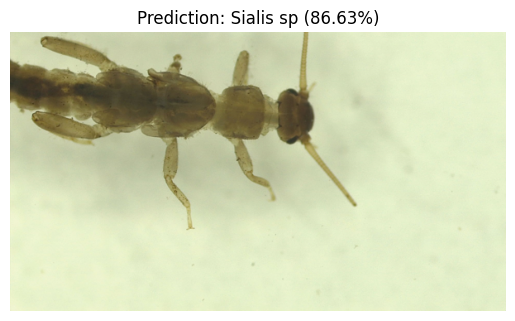

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Original Image: CPH-Leuctra sp.-1910-t.png --> Predicted: Sialis sp (90.85%)


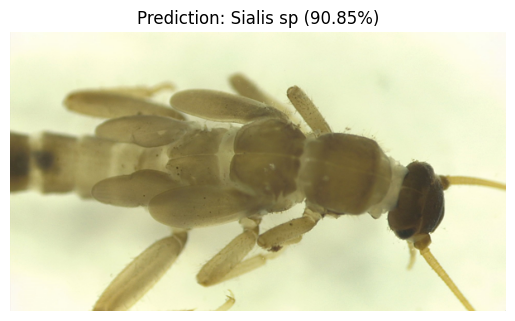

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Original Image: CPH-Lymnea sp.-1956-t.png --> Predicted: Lymnea sp (98.14%)


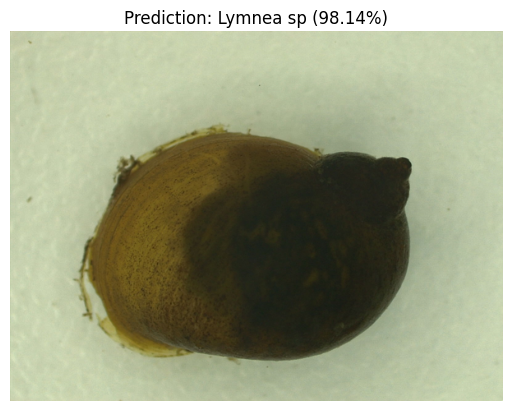

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Original Image: CPH-Lymnea sp.-1964-t.png --> Predicted: Sialis sp (71.65%)


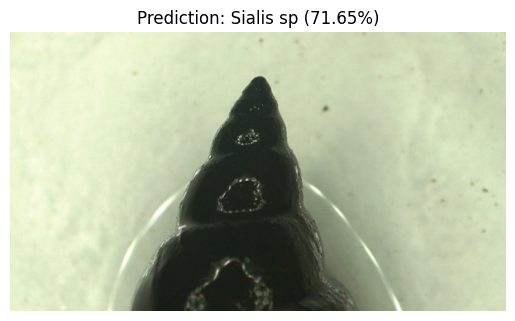

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
Original Image: CPH-Lymnea sp.-1973-t.png --> Predicted: Lymnea sp (89.39%)


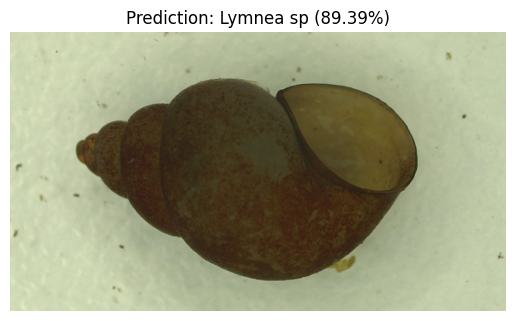

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
Original Image: CPH-Lymnea sp.-1967-t.png --> Predicted: Lymnea sp (96.44%)


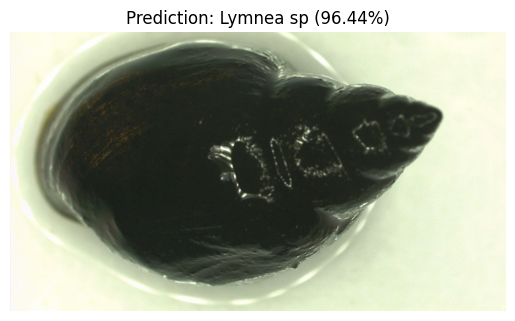

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
Original Image: CPH-Lymnea sp.-1958-t.png --> Predicted: Lymnea sp (42.67%)


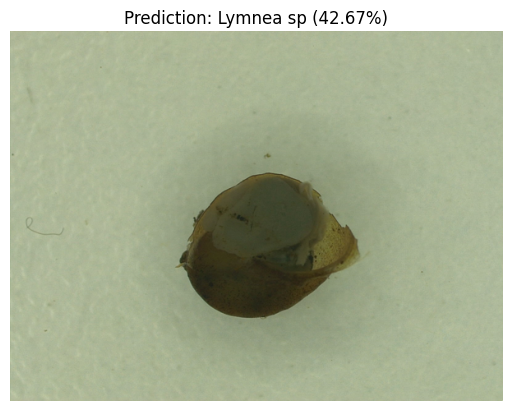

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
Original Image: CPH-Sialis sp.-2413-t.png --> Predicted: Lymnea sp (69.35%)


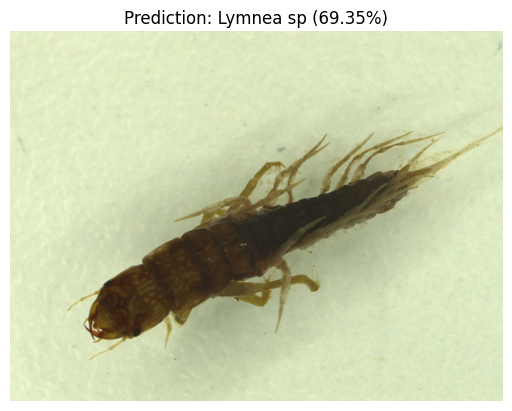

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
Original Image: CPH-Sialis sp.-2409-t.png --> Predicted: Sialis sp (68.39%)


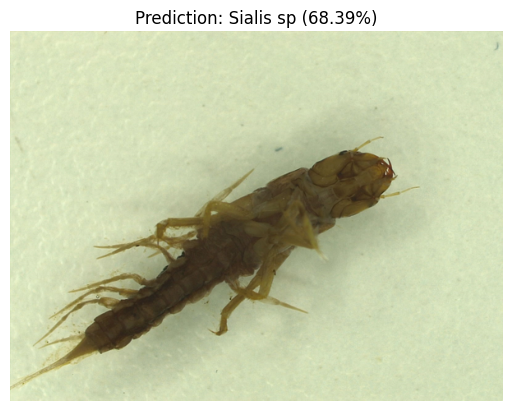

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
Original Image: CPH-Sialis sp.-2410-t.png --> Predicted: Sialis sp (62.33%)


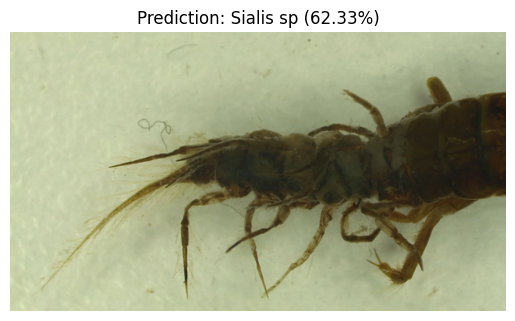

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
Original Image: CPH-Sialis sp.-2408-t.png --> Predicted: Lymnea sp (43.42%)


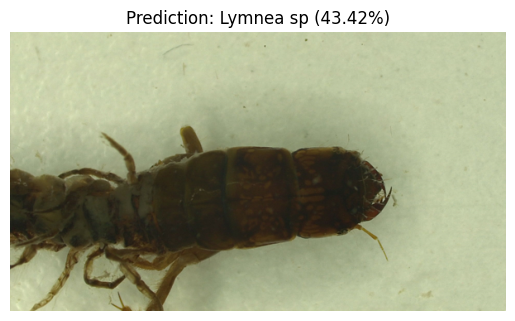

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
Original Image: CPH-Sialis sp.-2411-t.png --> Predicted: Sialis sp (84.35%)


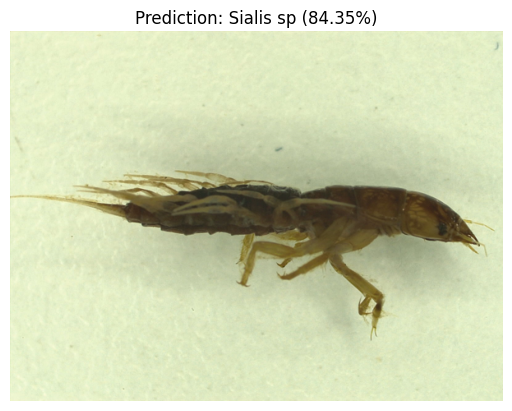

In [ ]:
# === STEP 12: Inference on new images in 'test_images' folder ===

#TEST_IMAGE_DIR = 'test_images'
TEST_IMAGE_DIR = '/content/drive/MyDrive/insects_dataset/test_data'
os.makedirs(TEST_IMAGE_DIR, exist_ok=True)

# Ensure IMG_SIZE is treated as a tuple for this function
_target_img_size = (IMG_SIZE, IMG_SIZE) if not isinstance(IMG_SIZE, tuple) else IMG_SIZE

def load_and_preprocess_image(img_path, img_size=_target_img_size):
    img = image.load_img(img_path, target_size=img_size)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # batch size 1
    return img_array

def predict_new_images(test_dir):
    img_files = [f for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if not img_files:
        print(f"No images found in '{test_dir}'. Please add some images and rerun.")
        return

    for img_file in img_files:
        path = os.path.join(test_dir, img_file)
        img_arr = load_and_preprocess_image(path)
        preds = model.predict(img_arr)
        pred_idx = np.argmax(preds[0])
        confidence = preds[0][pred_idx]

        print(f"Original Image: {img_file} --> Predicted: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        img = image.load_img(path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Prediction: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        plt.show()

print("Running inference on images from 'test_images' folder...")
predict_new_images(TEST_IMAGE_DIR)
